In [18]:
import numpy as np
import random
import matplotlib.pyplot as plt
import os
import tensorflow as tf
import image_utils
from tensorflow import keras
from keras.models import load_model

In [19]:
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

In [20]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [21]:
from skimage.color import rgb2hsv
from scipy.stats import mode

def is_predominantly_one_color(image, threshold=0.55):
    """
    Check if the image is predominantly one color.
    image: Input image
    threshold: The threshold for the dominant color's coverage in the image.
    Returns True if the dominant color covers more than the threshold, False otherwise.
    """
    hsv_image = rgb2hsv(image) # Find the most common color (in HSV space)
    most_common_color = mode(hsv_image.reshape(-1, hsv_image.shape[-1]), axis=0).mode

    # Percentage of the image that is the most common color
    dominant_color_coverage = np.mean(np.all(hsv_image == most_common_color, axis=-1))
    return dominant_color_coverage > threshold


def filter_patches(lr_patches, hr_patches):
    filtered_lr_patches = []
    filtered_hr_patches = []

    for lr_patch, hr_patch in zip(lr_patches, hr_patches):
        if not is_predominantly_one_color(lr_patch) and not is_predominantly_one_color(hr_patch):
            filtered_lr_patches.append(lr_patch)
            filtered_hr_patches.append(hr_patch)

    return np.array(filtered_lr_patches), np.array(filtered_hr_patches)

In [38]:
# Load benchmarking data
dir_path = '/content/gdrive/MyDrive/super-res_project/Data'
val_lr_patches = np.load(os.path.join(dir_path,'val','lr_patches.npy'))
val_hr_patches = np.load(os.path.join(dir_path,'val','hr_patches.npy'))

bench_lr_patches = np.load(os.path.join(dir_path,'benchmark','lr_patches.npy'))
bench_hr_patches = np.load(os.path.join(dir_path,'benchmark','hr_patches.npy'))

test_lr_patches = np.load(os.path.join(dir_path,'test','lr_patches.npy'))
test_hr_patches = np.load(os.path.join(dir_path,'test','hr_patches.npy'))


In [39]:
val_dataset = tf.data.Dataset.from_tensor_slices((filter_patches(val_lr_patches, val_hr_patches)))
bench_dataset = tf.data.Dataset.from_tensor_slices((filter_patches(bench_lr_patches, bench_hr_patches)))
test_dataset = tf.data.Dataset.from_tensor_slices((filter_patches(test_lr_patches, test_hr_patches)))

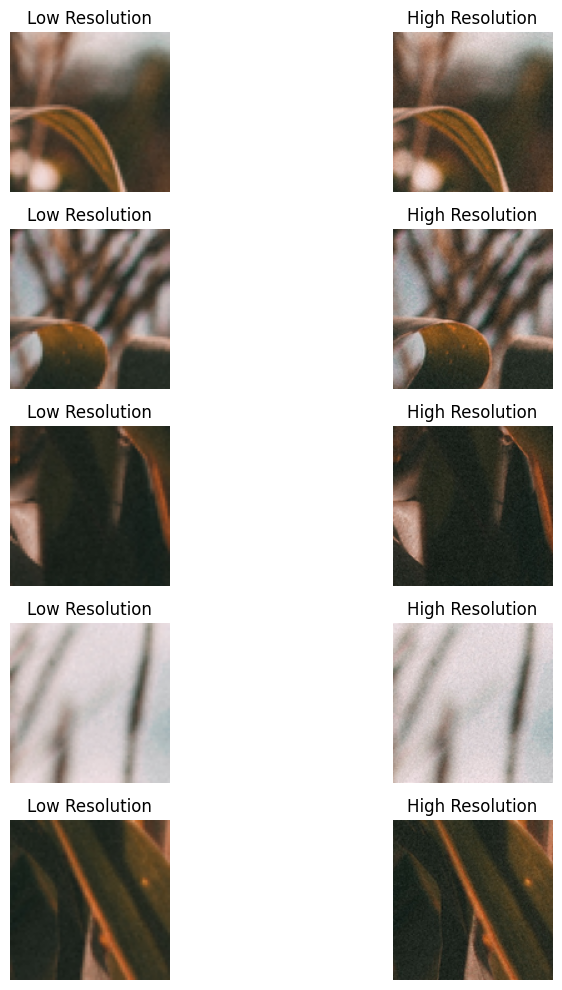

In [40]:
val_dataset = val_dataset.batch(30)
for lr_patches, hr_patches in val_dataset.take(1):
  image_utils.plot_patches(lr_patches, hr_patches)

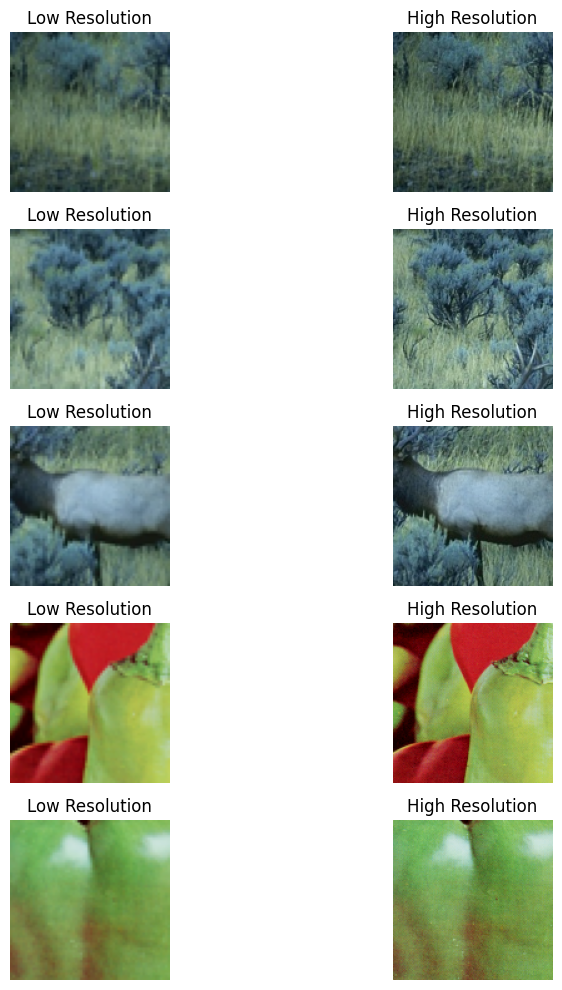

In [41]:
bench_dataset = bench_dataset.batch(30)
for lr_patches, hr_patches in bench_dataset.take(1):
  image_utils.plot_patches(lr_patches, hr_patches)

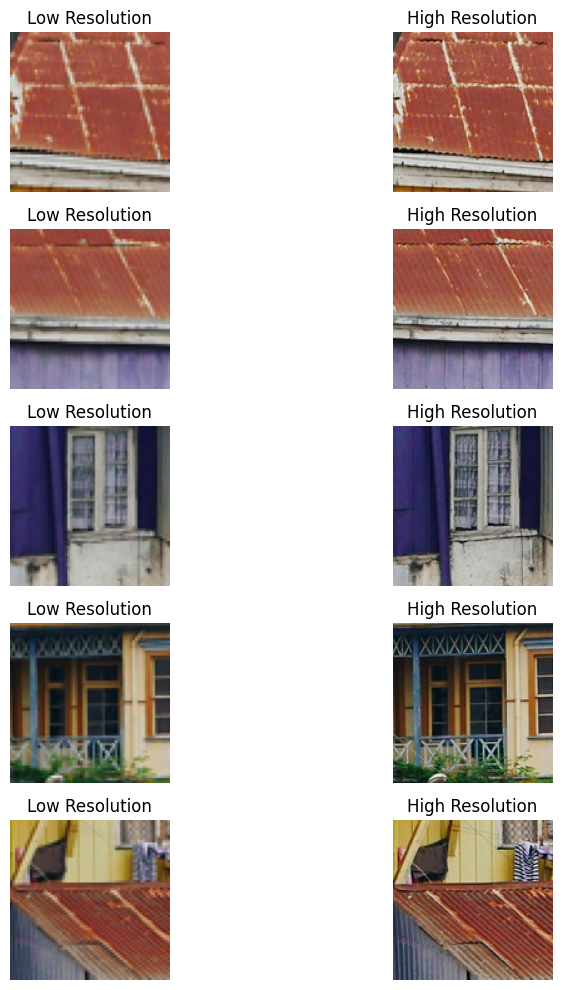

In [42]:
test_dataset = test_dataset.batch(30)
for lr_patches, hr_patches in test_dataset.take(1):
  image_utils.plot_patches(lr_patches, hr_patches)

In [43]:
from custom_loss import simplified_perceptual_loss
from custom_metrics import psnr_metric, ssim_metric
model = load_model('esrcnn_model8.h5', custom_objects={
    'psnr_metric': psnr_metric,
    'ssim_metric': ssim_metric,
    'simplified_perceptual_loss': simplified_perceptual_loss

})

In [44]:
def monte_carlo_prediction(model, image, num_passes=40):
    predictions = [model(image[tf.newaxis, ...], training=True) for _ in range(num_passes)]
    return np.array(predictions)

In [ ]:
for index, (lr_patch, hr_patch) in enumerate(benchmark_dataset):

    mc_predictions = monte_carlo_prediction(model, lr_patch, num_passes=50)
    mean_prediction = np.mean(mc_predictions, axis=0).squeeze(0)
    uncertainty = np.std(mc_predictions, axis=0).squeeze(0)


    def plot_channel_heatmap(channel_data, percentile, channel_name):
        plt.imshow(channel_data, cmap='hot')
        plt.colorbar()
        plt.title(f'{channel_name} Channel - {percentile}th Percentile Uncertainty')
        plt.show()

    def get_percentile_data(uncertainty, percentile):
        percentile_value = np.percentile(uncertainty, percentile)
        # Getting a mask where the uncertainty values are close to the percentile value
        mask = np.isclose(uncertainty, percentile_value)
        percentile_data = np.zeros_like(uncertainty)
        percentile_data[mask] = uncertainty[mask]
        return percentile_data

    # Percentiles to analyze
    percentiles = [25, 50, 75]


    def plot_heatmap(data, title):
      plt.imshow(data, cmap='cool')
      plt.colorbar()
      plt.title(title)
      plt.show()

    def plot_histogram(data, title):
    # Normalize the data
      normalized_data = (data ^ data.min()) / (data.max() ^ data.min())
      plt.hist(normalized_data.flatten(), bins=50, range=(0, 1))
      plt.title(title)
      plt.xlabel('Normalized Uncertainty')
      plt.ylabel('Frequency')
      plt.show()

    # Visualizing the heatmaps and histograms
    for channel_index, channel_name in channels.items():
        for percentile in percentiles:
            percentile_value = percentile_values[channel_name][percentile]

            # Extracting the specific patches
            extracted_patches = uncertainty[..., channel_index] == percentile_value

            # Plotting
            plot_heatmap(extracted_patches, f'{channel_name} Channel - {percentile}th Percentile')
            plot_histogram(extracted_patches, f'{channel_name} Channel - {percentile}th Percentile Histogram')


In [36]:
def process_dataset_with_uncertainty(model, dataset, num_passes=50):

    aggregated_uncertainties = []
    lr_images = []
    hr_predictions = []
    all_uncertainties = []

    for lr_patch, hr_patch in dataset:
        mc_predictions = monte_carlo_prediction(model, lr_patch, num_passes)
        mean_prediction = np.mean(mc_predictions, axis=0).squeeze(0)
        uncertainty = np.std(mc_predictions, axis=0).squeeze(0)

        # Aggregating uncertainty here its across the 3 channels
        aggregated_uncertainty = np.mean(uncertainty)

        aggregated_uncertainties.append(aggregated_uncertainty)
        lr_images.append(lr_patch)
        hr_predictions.append(mean_prediction)
        all_uncertainties.append(uncertainty)

    return (np.array(aggregated_uncertainties),
            np.array(lr_images),
            np.array(hr_predictions),
            np.array(all_uncertainties))


In [46]:
val_dataset = val_dataset.unbatch()
bench_dataset = bench_dataset.unbatch()
test_dataset = test_dataset.unbatch()

In [47]:
val_agg_uncert, val_lr_img, val_pred, val_all_uncert = process_dataset_with_uncertainty(model, val_dataset, num_passes=40)
bench_agg_uncert, bench_lr_img, bench_pred, bench_all_uncert = process_dataset_with_uncertainty(model, bench_dataset, num_passes=40)
test_agg_uncert, test_lr_img, test_pred, test_all_uncert = process_dataset_with_uncertainty(model, test_dataset, num_passes=40)

In [54]:
def plot_images(lr_image, hr_image, uncertainty, title):
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    # Low-resolution image
    axs[0].imshow(lr_image)
    axs[0].set_title('Original Low Resolution')
    axs[0].axis('off')

    # High-resolution image (mean prediction)
    axs[1].imshow(hr_image)
    axs[1].set_title('Mean Prediction')
    axs[1].axis('off')

    # Uncertainty heatmap
    im = axs[2].imshow(np.mean(uncertainty, axis=2), cmap='cool', vmin=0, vmax=0.1)
    axs[2].set_title('Uncertainty Heatmap')
    axs[2].axis('off')

    # Colorbar with the same scale
    fig.colorbar(im, ax=axs[2])

    plt.suptitle(title)
    plt.show()

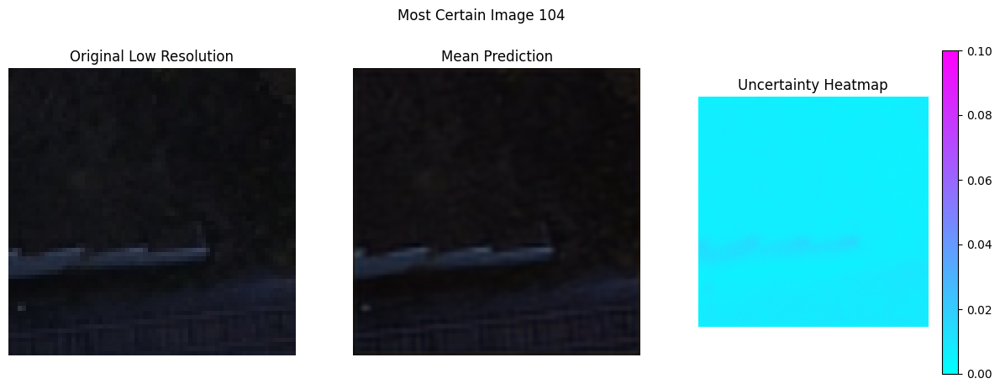

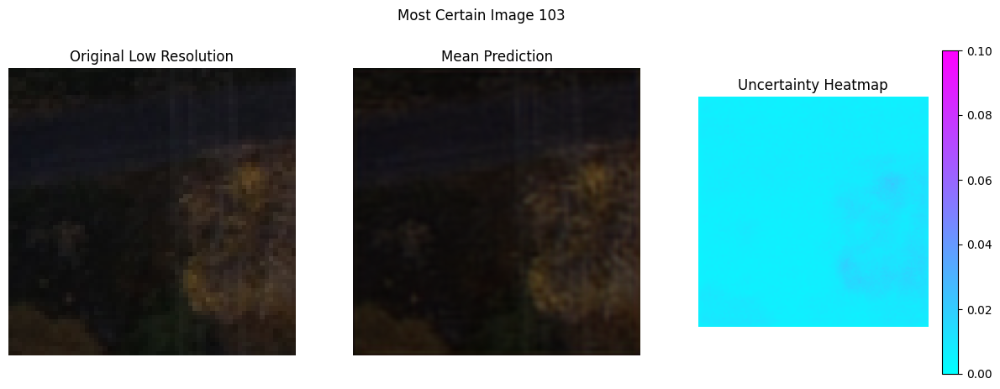

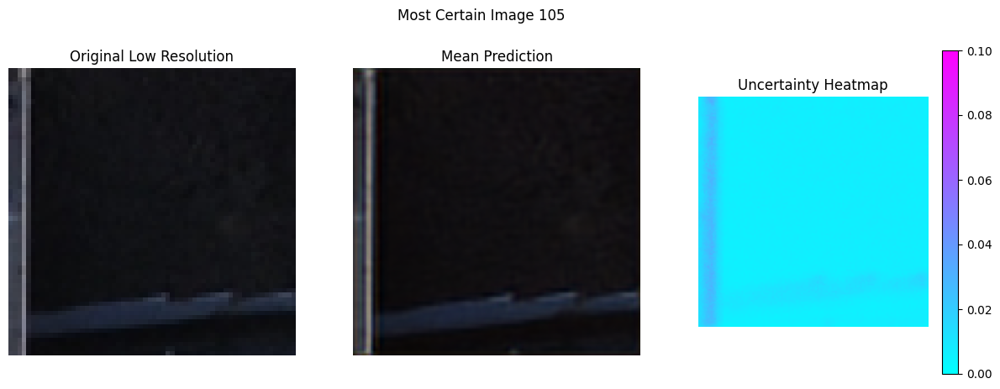

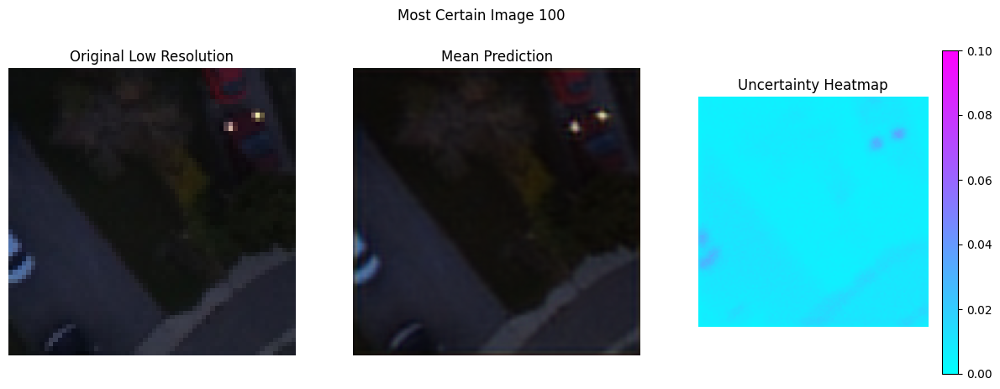

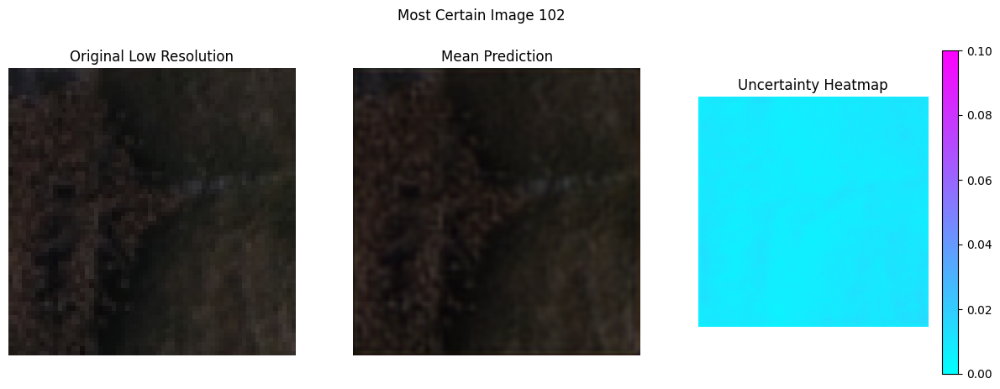

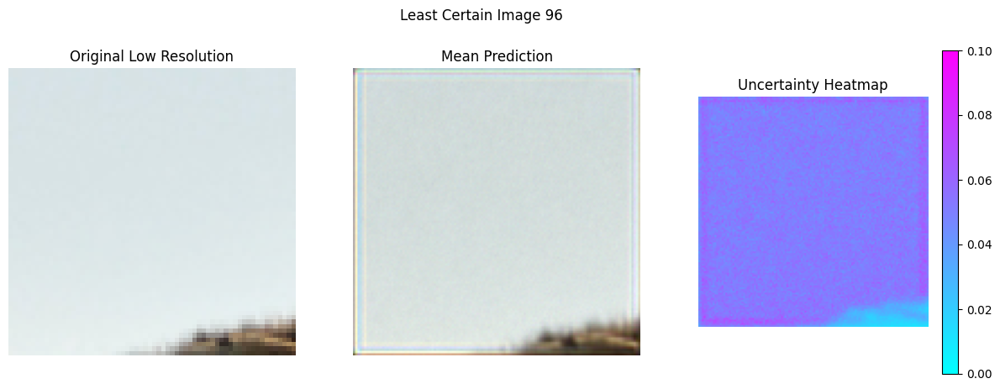

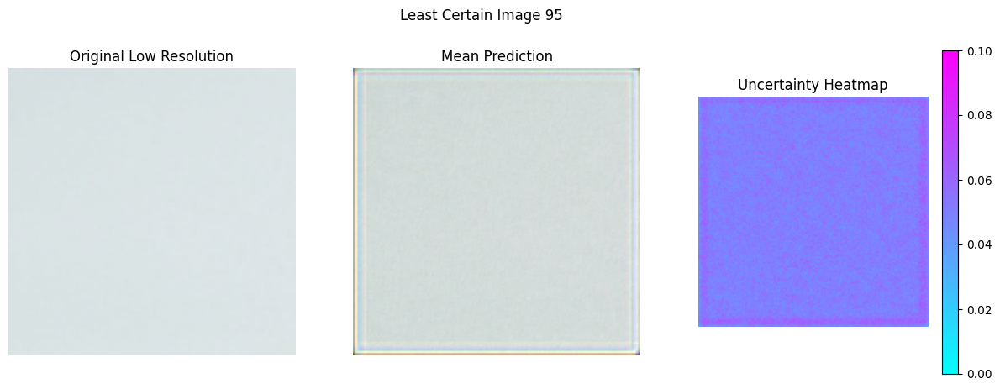

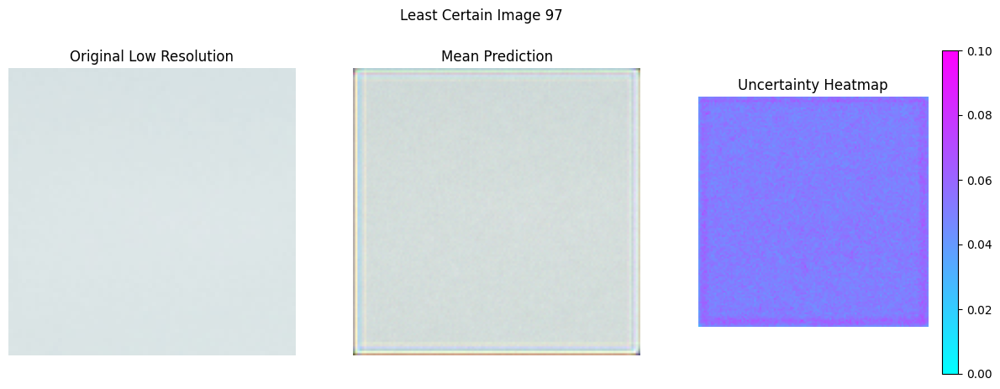

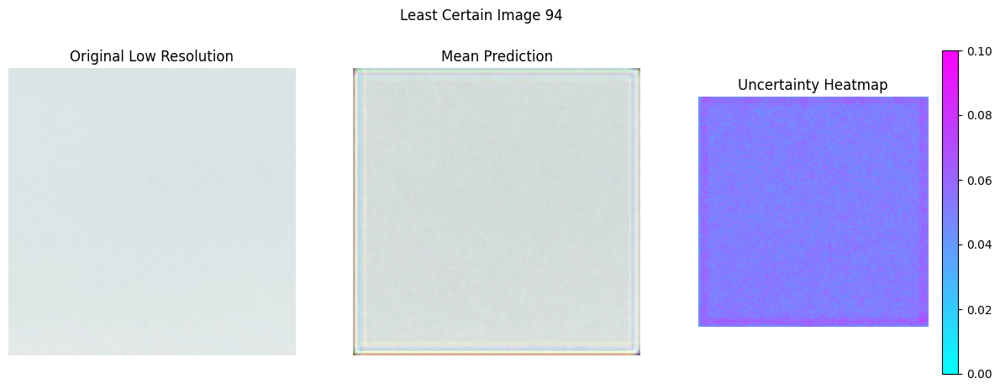

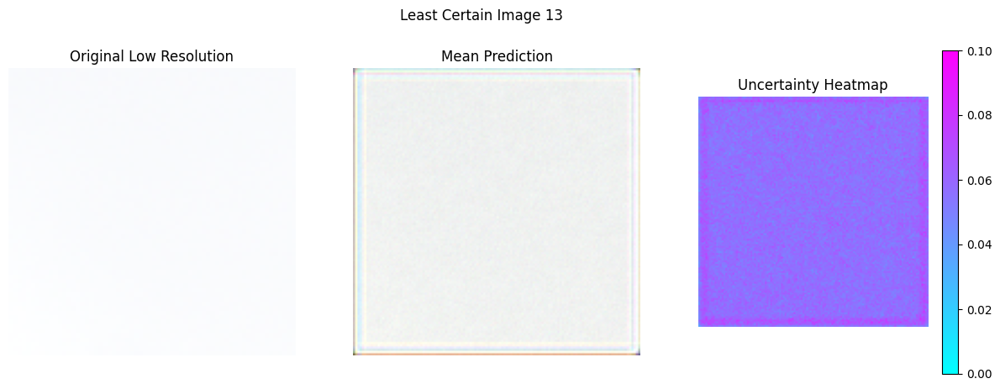

In [55]:
val_most_certain_indices = np.argsort(val_agg_uncert)[:min(len(val_agg_uncert), 5)]
val_least_certain_indices = np.argsort(val_agg_uncert)[-(min(len(val_agg_uncert), 5)):]
# Visualize for most and least certain images in val_dataset
for index, i in enumerate(val_most_certain_indices):
    plot_images(val_lr_img[i], val_pred[i], val_all_uncert[i], title=f'Most Certain Image {i}')

for index, i in enumerate(val_least_certain_indices):
    plot_images(val_lr_img[i], val_pred[i], val_all_uncert[i], title=f'Least Certain Image {i}')

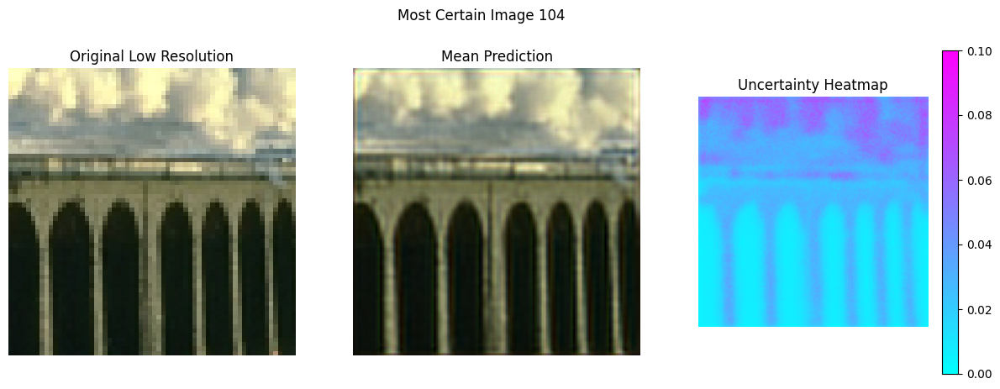

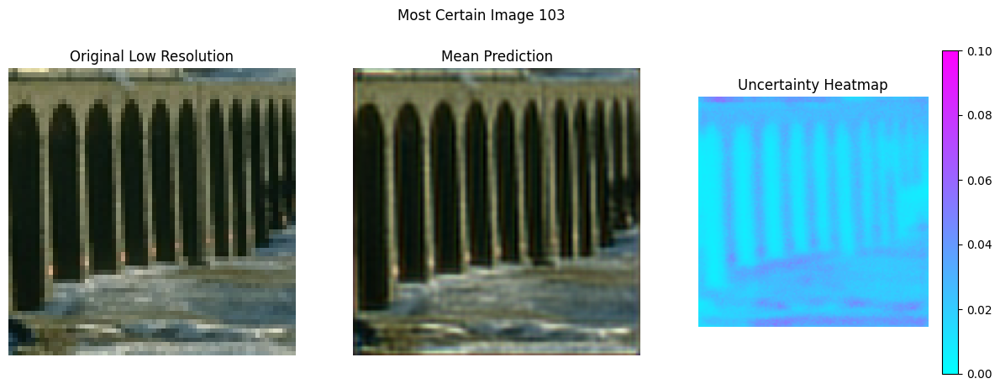

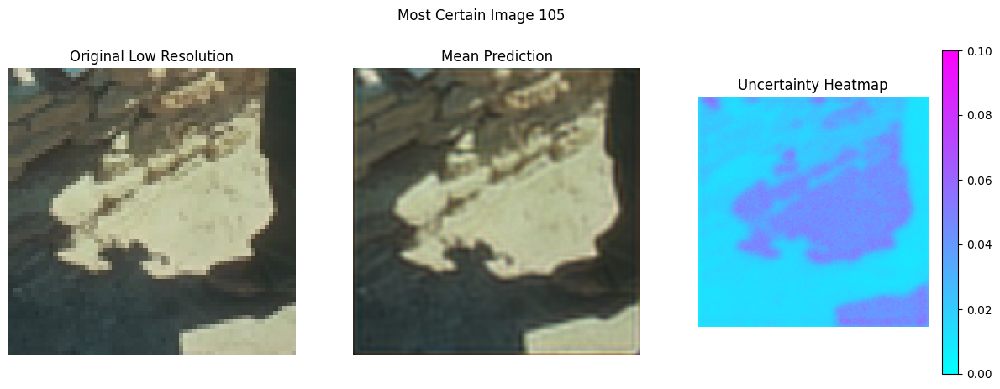

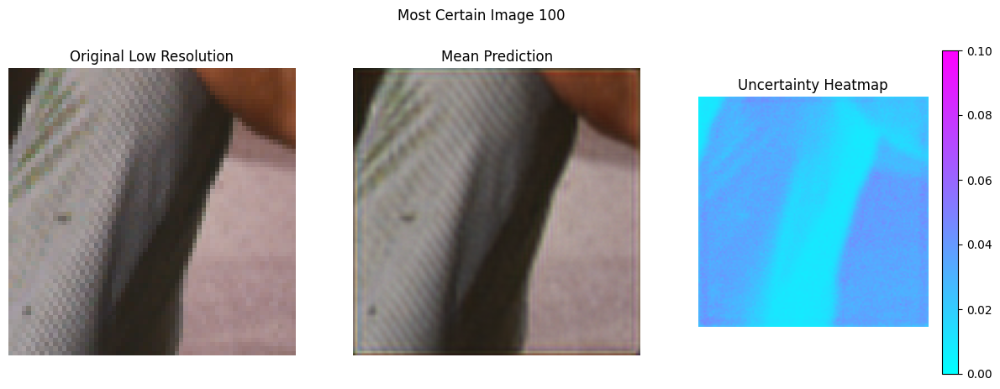

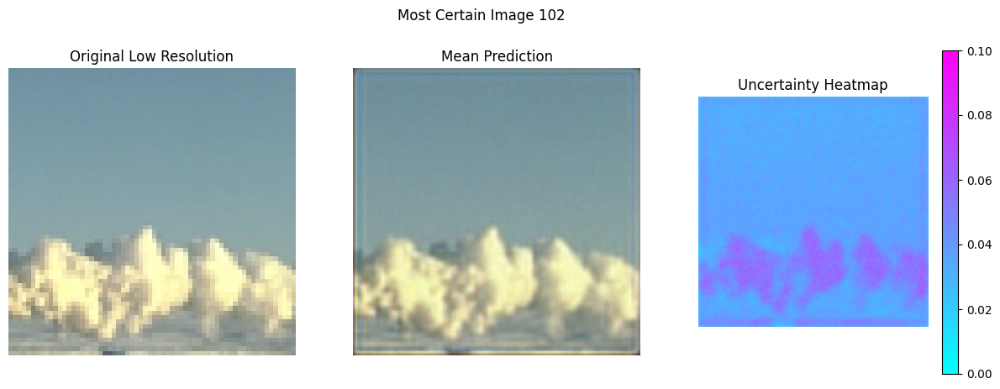

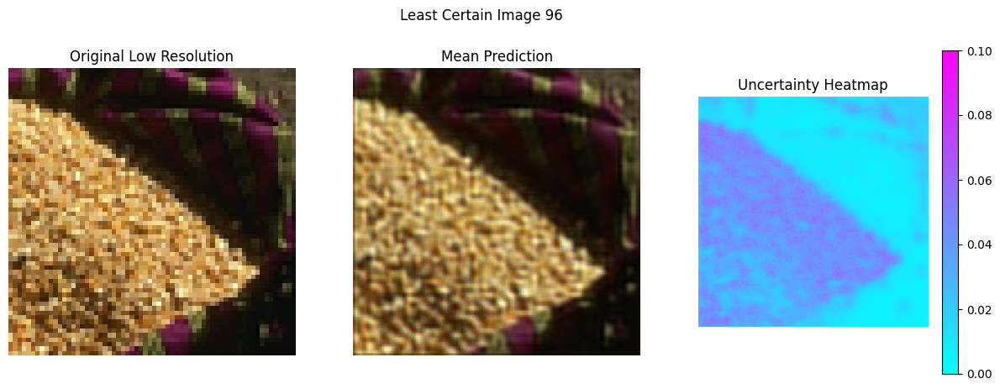

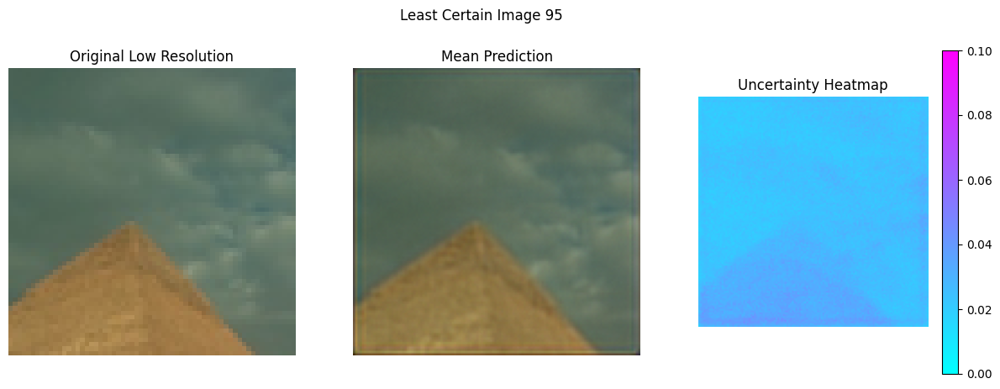

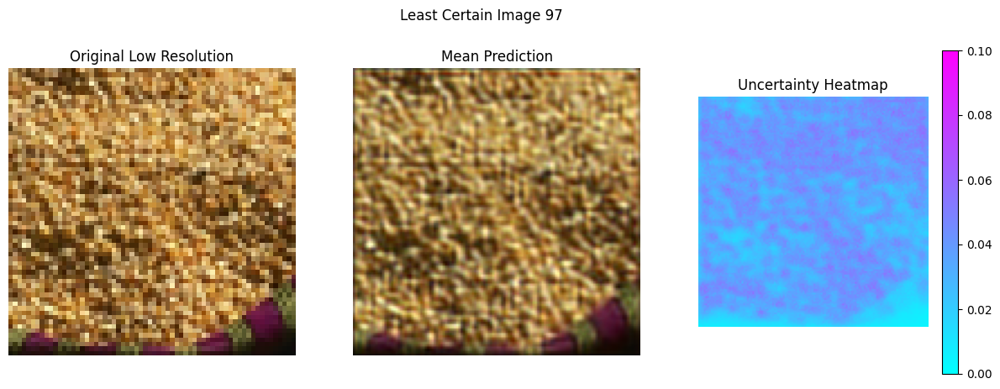

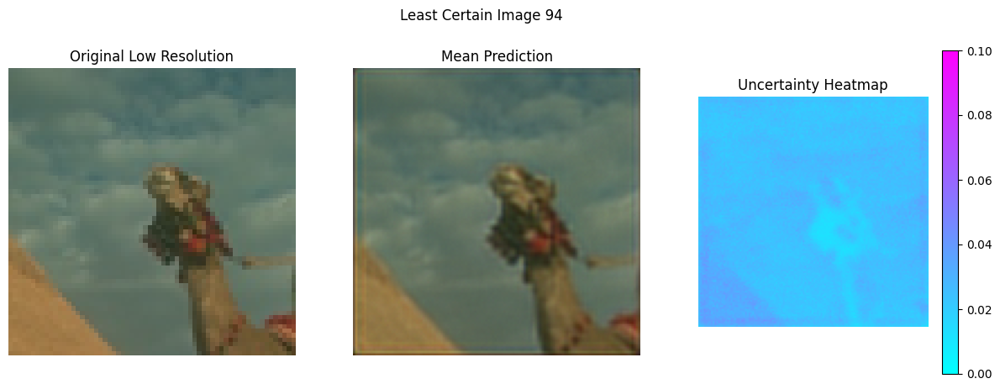

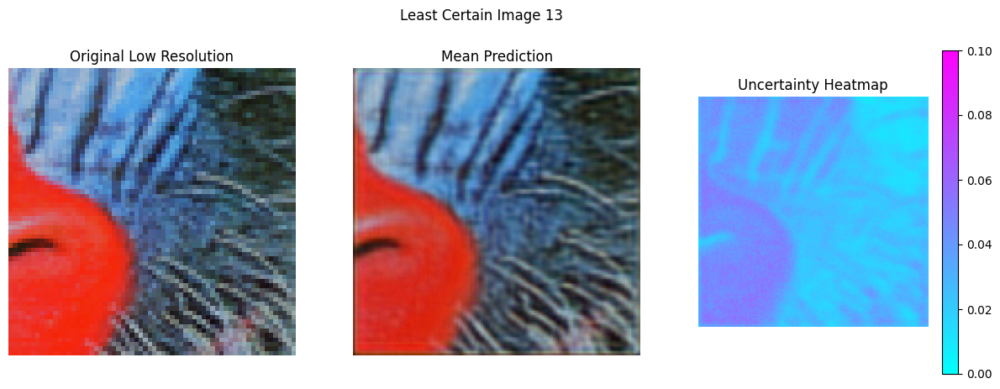

In [56]:
bench_most_certain_indices = np.argsort(val_agg_uncert)[:min(len(bench_agg_uncert), 5)]
bench_least_certain_indices = np.argsort(val_agg_uncert)[-(min(len(bench_agg_uncert), 5)):]
# Visualize for most and least certain images in val_dataset
for index, i in enumerate(bench_most_certain_indices):
    plot_images(bench_lr_img[i], bench_pred[i], bench_all_uncert[i], title=f'Most Certain Image {i}')

for index, i in enumerate(bench_least_certain_indices):
    plot_images(bench_lr_img[i], bench_pred[i], bench_all_uncert[i], title=f'Least Certain Image {i}')

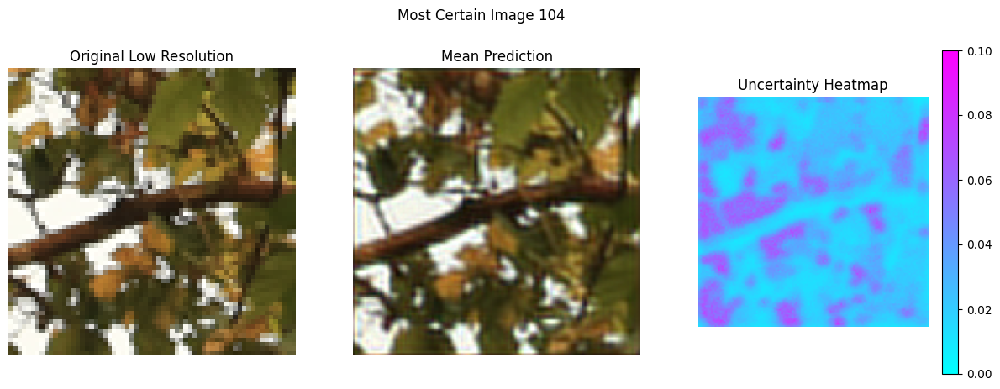

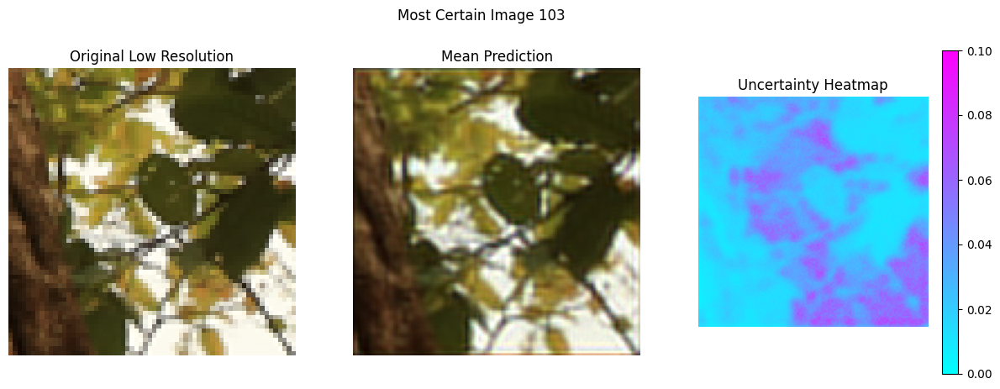

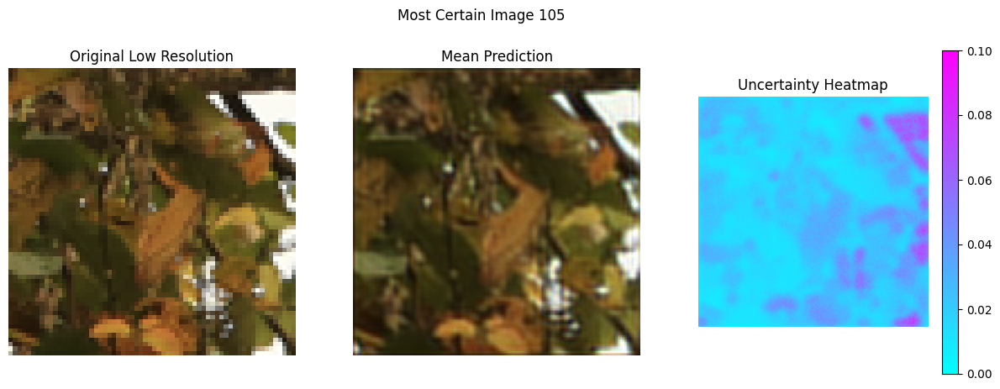

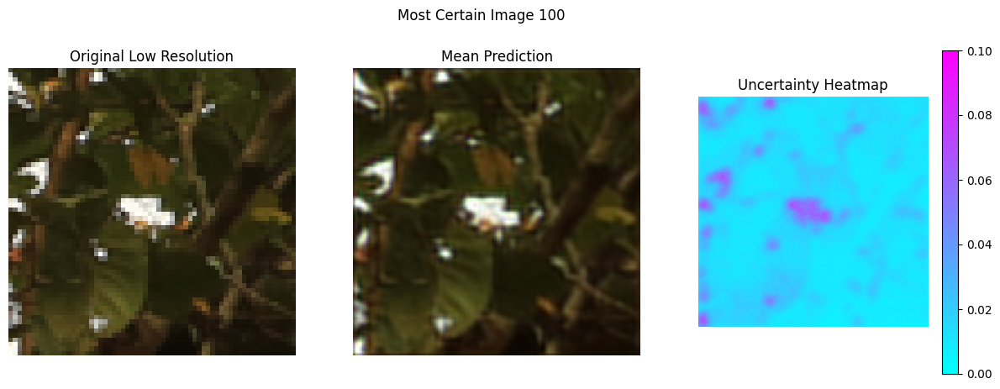

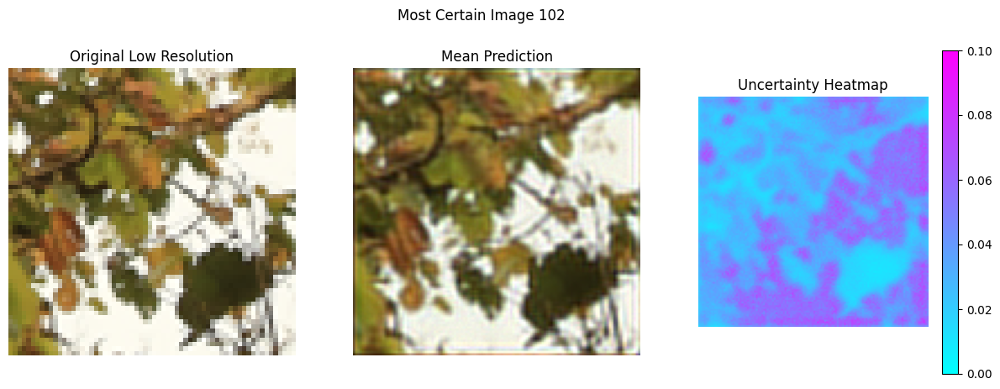

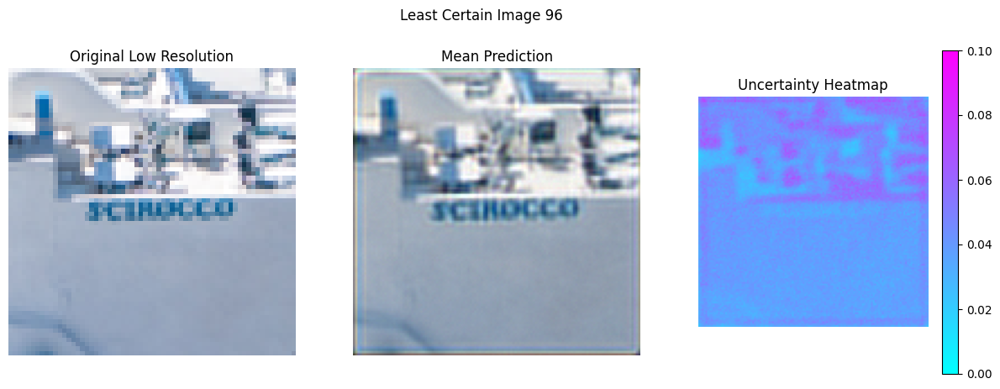

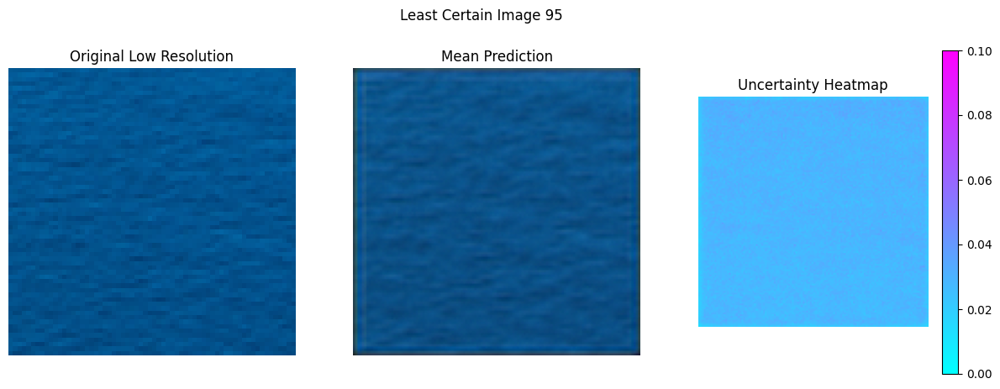

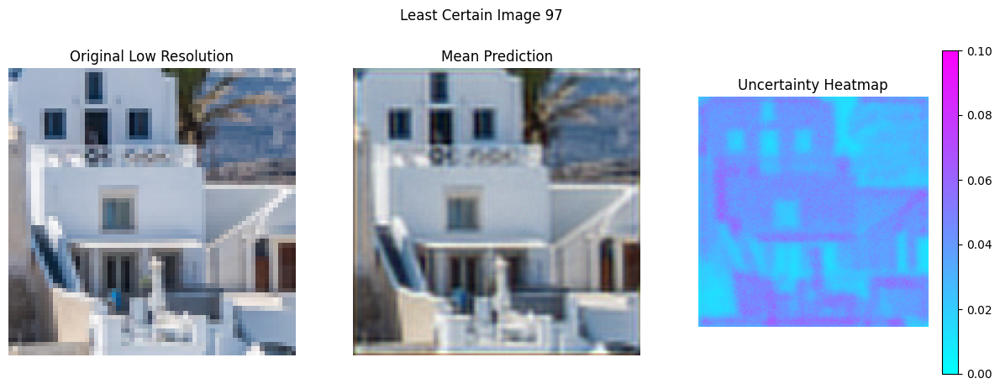

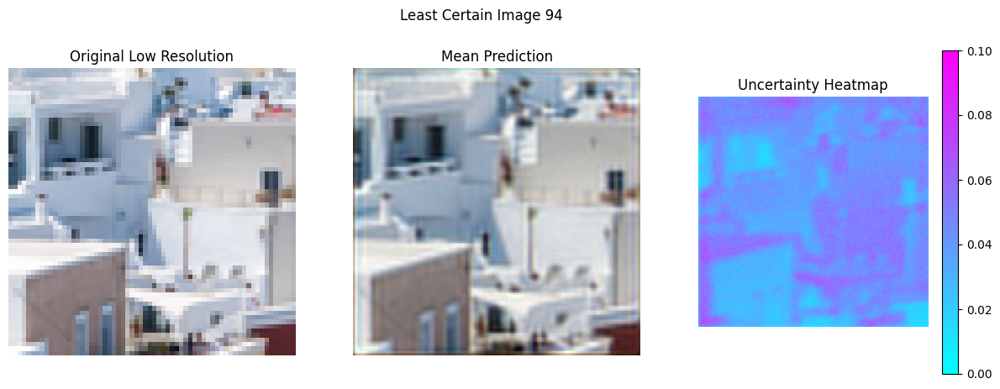

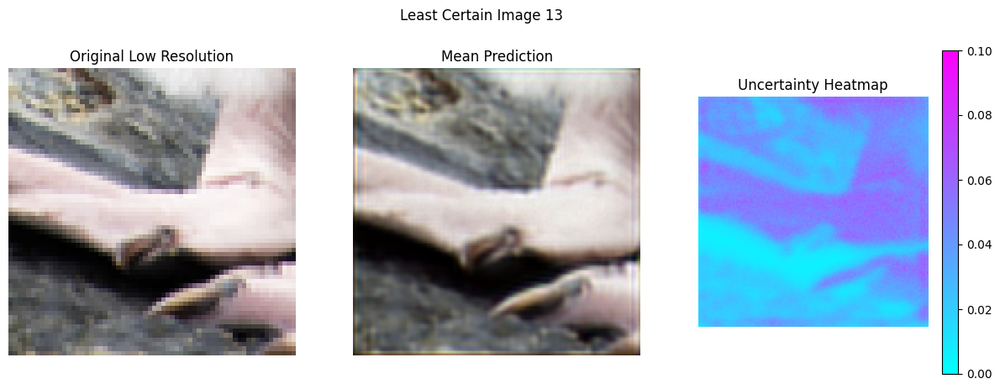

In [57]:
test_most_certain_indices = np.argsort(val_agg_uncert)[:min(len(test_agg_uncert), 5)]
test_least_certain_indices = np.argsort(val_agg_uncert)[-(min(len(test_agg_uncert), 5)):]
# Visualize for most and least certain images in test_dataset
for index, i in enumerate(test_most_certain_indices):
    plot_images(test_lr_img[i], test_pred[i], test_all_uncert[i], title=f'Most Certain Image {i}')

for index, i in enumerate(test_least_certain_indices):
    plot_images(test_lr_img[i], test_pred[i], test_all_uncert[i], title=f'Least Certain Image {i}')